# Decision Trees and Random Forests

This section focuses on tree-based models, such as random forests. A common critcism of decision trees is that they overfit to the training data. Ensemble methods such as random forests are used to address this issue. Random forests are a collection of decision trees which when unified can make better predictions than any individual tree.

### A Decision Tree in Scikit-Learn

In [1]:
#Setup
import numpy as np #numerical computation
import pandas as pd #data wrangling
import matplotlib.pyplot as plt #plotting package
#Next line helps with rendering plots
%matplotlib inline
import matplotlib as mpl #add'l plotting functionality
mpl.rcParams['figure.dpi'] = 400 #high res figures
import graphviz #to visualize decision trees

In [2]:
#Load data
df = pd.read_csv('/home/joseph/python_projects/Chapter_1_cleaned_data.csv')

In [3]:
#Column Names
features_response = df.columns.tolist()

#Remove Columns that aren't features or the response variable
items_to_remove = ['ID', 'SEX', 'PAY_2', 'PAY_3','PAY_4', 'PAY_5', 'PAY_6',\
'EDUCATION_CAT', 'graduate school','high school', 'none','others', 'university']

#List Comprehension to do the removing
features_response = [item for item in features_response if item not in items_to_remove]
features_response

['LIMIT_BAL',
 'EDUCATION',
 'MARRIAGE',
 'AGE',
 'PAY_1',
 'BILL_AMT1',
 'BILL_AMT2',
 'BILL_AMT3',
 'BILL_AMT4',
 'BILL_AMT5',
 'BILL_AMT6',
 'PAY_AMT1',
 'PAY_AMT2',
 'PAY_AMT3',
 'PAY_AMT4',
 'PAY_AMT5',
 'PAY_AMT6',
 'default payment next month']

In [4]:
#Imports from Scikit-Learn
from sklearn.model_selection import train_test_split
from sklearn import tree

In [5]:
#Split into test and train data
X_train, X_test, y_train, y_test = train_test_split(df[features_response[:-1]].values,
                                                    df['default payment next month'].values,
                                                    test_size=0.2, random_state=24)

In [6]:
#Set up the decision tree
dt = tree.DecisionTreeClassifier(max_depth = 2)

In [7]:
#Fit and grow the decision tree
dt.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=2)

In [8]:
#Export the trained model to graphviz
dot_data = tree.export_graphviz(dt,
                                out_file=None,
                                filled=True,
                                rounded=True,
                                feature_names=\
                                features_response[:-1],
                                proportion=True,
                                class_names=[
                                'Not defaulted', 'Defaulted'])

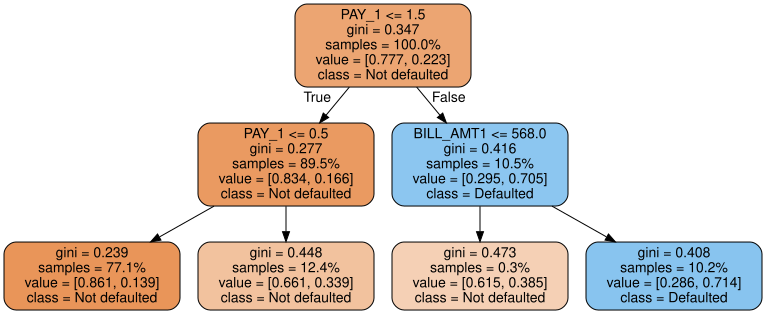

In [9]:
#Display Graphviz model
graph = graphviz.Source(dot_data)
graph

In [10]:
#Confirm the proportion of training data where PAY_1 is <= 1.5
features_response[:-1].index('PAY_1')

4

In [11]:
X_train.shape

(21331, 17)

To confirm the fraction of samples following the first split of the decision tree, we need to know the proportion of samples, where the ``PAY_1`` feature meets the Boolean condition, that was used to make this split. To do this, we can use the index of the ``PAY_1`` feature in the training data, corresponding to the index in the list of feature names, and the number of samples in the training data, which is the number of rows we observed from ``.shape``.

In [13]:
(X_train[:,4]<=1.5).sum()/X_train.shape[0] #Confirmed

0.8946134733486475

In [14]:
y_train.mean()

0.223102526838873

## Importance of ``max_depth``

``max_depth`` was the only hyperparameter specified for this exercise. Without placing a limit on this depth, the tree will be grown until one of the other limitations, specified by another hyperparameter takes effect. This can lead to very deep nodes and very large and complex trees. 

In [15]:
#Decision Tree without max_depth
dt = tree.DecisionTreeClassifier()
dt.fit(X_train, y_train)

#Export the trained model to graphviz
dot_data = tree.export_graphviz(dt,
                                out_file=None,
                                filled=True,
                                rounded=True,
                                feature_names=\
                                features_response[:-1],
                                proportion=True,
                                class_names=[
                                'Not defaulted', 'Defaulted'])

#Display Graphviz model
graph = graphviz.Source(dot_data)
graph

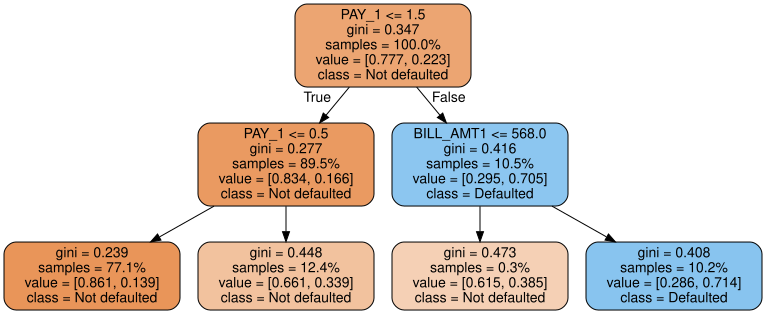

In [16]:
#Return Decision Tree to normal
#Decision Tree without max_depth
dt = tree.DecisionTreeClassifier(max_depth = 2)
dt.fit(X_train, y_train)

#Export the trained model to graphviz
dot_data = tree.export_graphviz(dt,
                                out_file=None,
                                filled=True,
                                rounded=True,
                                feature_names=\
                                features_response[:-1],
                                proportion=True,
                                class_names=[
                                'Not defaulted', 'Defaulted'])

#Display Graphviz model
graph = graphviz.Source(dot_data)
graph

## Training Decision Trees: Node Impurity 

We will now learn how decision trees are trained. The training process involves selecting features to split nodes on, and the thresholds at which to make splits, for example ``PAY_1 <= 1.5`` for the first split in the tree of the previous exercise. Computationally, this means the samples in each node must be sorted on the values of each feature to consider a split for, and splits between each successive pair of sorted feature values are considered. All features may be considered, or only a subset as we will learn about shortly.

### How are Splits Decided During the Training Process?

The goal is to have the node split such that the next two nodes after the split have a higher purity - are closer to containing only positive samples or only negative samples. In practice, decision trees are trained using the inverse of purity - node impurity. This is a measure of how far the node is from having 100% of the training samples in one class. It is analogous to the cost function. Node impurity is most intuitively understood as the **misclassification rate**.

In [17]:
#Visualize the Misclassification Rate
pm0 = np.linspace(0.01,0.99,99)
pm1 = 1 - pm0

The fraction of the positive class for this node is $1 - p_{m0}$

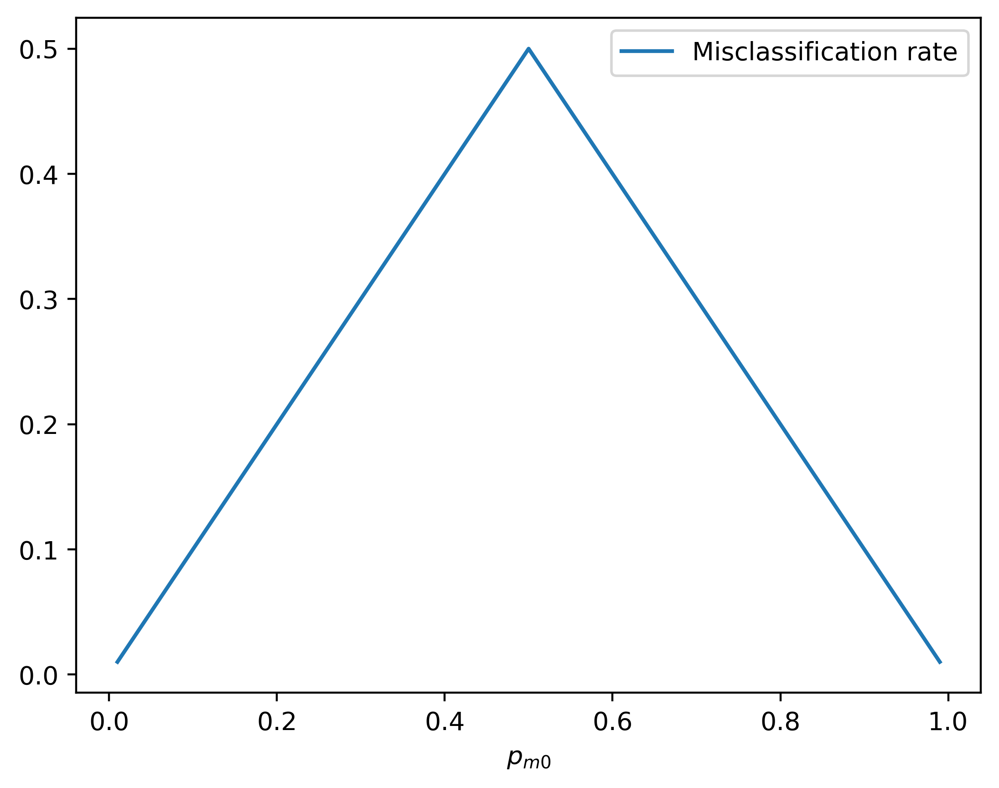

In [19]:
#Calculate the Mislcassification Rate and plot it
misclassification_rate = np.minimum(pm0, pm1)

mpl.rcParams['figure.dpi'] = 400
plt.plot(pm0, misclassification_rate, label = 'Misclassification rate')
plt.xlabel('$p_{m0}$')
plt.legend()

Every time a node is split when growing a decision tree, two new nodes are created. Since the prediction from either of these new nodes is simply the majority class, an important goal will be to reduce the misclassification rate. Therefore, we will want to find a feature, from all the possible features, and a value of this feature at which to make a cut point, so that the misclassification rate in the two new nodes will be as low as possible when averaging over all the classes. This is very close to the actual process that is used to train decision trees.

Continuing for the moment with the idea of minimizing the misclassification rate, the decision tree training algorithm goes about node splitting by considering all the features, although the algorithm may possibly only consider a randomly selected subset if you set the ``max_features`` hyperparameter to anything less than the total number of features. We'll discuss possible reasons for doing this later. In either case, the algorithm then considers each possible threshold for every candidate feature and chooses the one that results in the lowest impurity, calculated as the average impurity across the two possible new nodes, weighted by the number of samples in each node.This process is repeated until a stopping criterion of the tree, such as ``max_depth``, is reached:

While the misclassification rate is an intuitive measure of impurity, it happens that there are better measures that can be used to find splits during the model training process. The two options that are available in scikit-learn for the impurity calculation, which you can specify with the ``criterion`` keyword argument, are the **Gini impurity** and the **cross-entropy** options.

In [20]:
#Gini Impurity
gini = (pm0*(1-pm0)) +(pm1*(1-pm1))

In [21]:
#Cross Entropy
cross_ent = -1*((pm0*np.log(pm0)) + (pm1*np.log(pm1)))

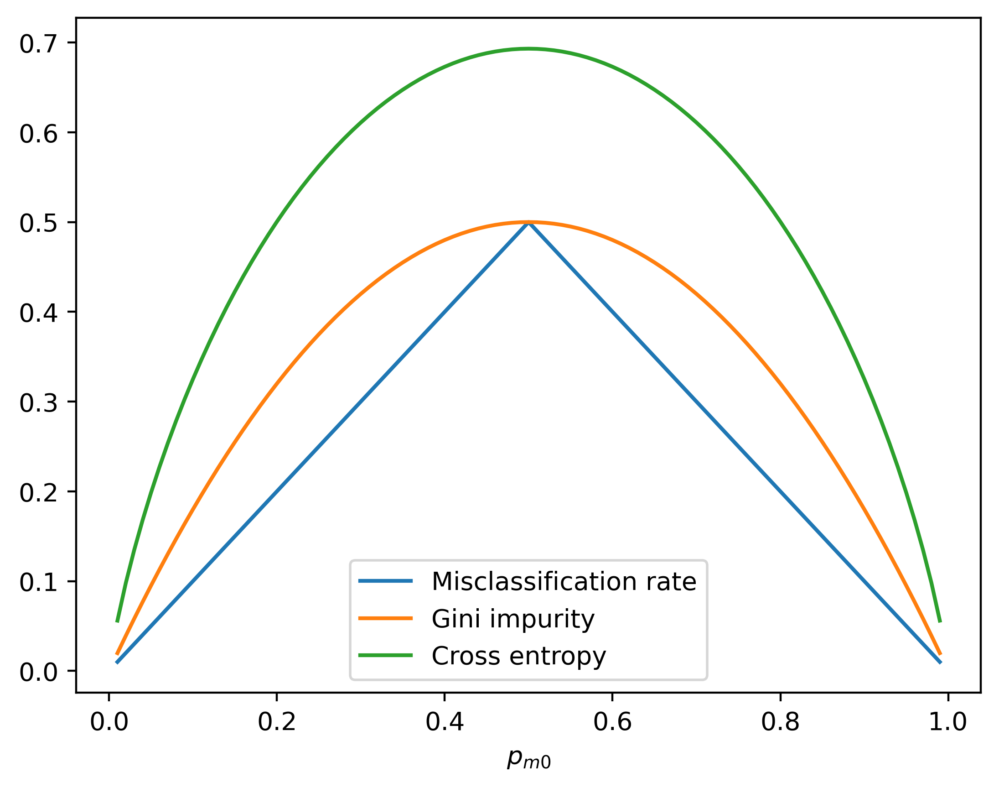

In [22]:
#Graph Gini Impurity and Cross Entropy
mpl.rcParams['figure.dpi'] = 400
plt.plot(pm0, misclassification_rate,label='Misclassification rate')
plt.plot(pm0, gini, label='Gini impurity')
plt.plot(pm0, cross_ent, label='Cross entropy')
plt.xlabel('$p_{m0}$')
plt.legend()

Note that in scikit-learn, Gini impurity can be specified with the criterion argument using the '`gini`' string, while cross-entropy is just referred to as '`entropy`'.

## Advantages of Decision Trees

- No need to scale features

- Theey can describe complex non-linear relationships of single features as well as interactions between features.

## `GridSearchCV` - A More Convenient Approach to Cross-Validation

Below, `GridSearchCV` will be used to find optimal hyperparameters for a decision tree.

In [23]:
#Import 
from sklearn.model_selection import GridSearchCV

In [24]:
#Define the hyperparameters we want to search using cross-validation
X_train.shape

(21331, 17)

With 21,331 samples and 4-fold cross validation, 3/4ths of the samples are used - about 16,000 samples in each fold.
The theoretical limit of a decision tree with L nodes is calculated using $Log2(L)$. In the case of our data above, the maximum limit is a depth of 14.

This helps give us an idea of the range of values we should consider for ``max_depth``. Below, we will explore a range of values from 1 to 12.

In [25]:
#Values to test to find the best max_depth 
params = {'max_depth':[1,2,4,6,8,10,12]}

In [26]:
#Decision Tree
dt = tree.DecisionTreeClassifier()

In [27]:
#Cross-Validation with GridSearchCV
cv = GridSearchCV(dt, param_grid=params, scoring='roc_auc',
                  n_jobs=None, refit=True, cv=4, verbose=1,
                  pre_dispatch=None, error_score=np.nan,
                  return_train_score=True)

cv.fit(X_train, y_train)

Fitting 4 folds for each of 7 candidates, totalling 28 fits


GridSearchCV(cv=4, estimator=DecisionTreeClassifier(),
             param_grid={'max_depth': [1, 2, 4, 6, 8, 10, 12]},
             pre_dispatch=None, return_train_score=True, scoring='roc_auc',
             verbose=1)

In [29]:
#Make a Dataframe of the cross-validation results
cv_results_df = pd.DataFrame(cv.cv_results_)
cv_results_df

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,mean_train_score,std_train_score
0,0.024259,0.011839,0.012039,0.017450,1,{'max_depth': 1},0.639514,0.643398,0.651891,0.650753,0.646389,0.005136,7,0.648680,0.647384,0.644553,0.644934,0.646388,0.001712
1,0.034473,0.001181,0.002063,0.000062,2,{'max_depth': 2},0.695134,0.699022,0.713376,0.699510,0.701761,0.006917,5,0.704034,0.702700,0.698113,0.702535,0.701845,0.002232
2,0.067822,0.002940,0.002780,0.000663,4,{'max_depth': 4},0.732720,0.740116,0.746946,0.743731,0.740878,0.005294,2,0.756882,0.752256,0.749368,0.753055,0.752890,0.002682
3,0.099196,0.001806,0.002719,0.000348,6,{'max_depth': 6},0.744848,0.745998,0.752120,0.741356,0.746081,0.003883,1,0.782202,0.780125,0.775228,0.774776,0.778083,0.003171
4,0.128992,0.002974,0.002534,0.000047,8,{'max_depth': 8},0.729778,0.733857,0.748868,0.729612,0.735529,0.007887,3,0.811734,0.808296,0.803345,0.802003,0.806344,0.003896
5,0.154602,0.004211,0.002610,0.000084,10,{'max_depth': 10},0.712181,0.707523,0.715966,0.715344,0.712753,0.003344,4,0.848747,0.853780,0.841208,0.836315,0.845012,0.006726
6,0.186958,0.006978,0.003056,0.000352,12,{'max_depth': 12},0.676291,0.654092,0.673473,0.682059,0.671479,0.010504,6,0.887804,0.903653,0.885436,0.875991,0.888221,0.009945


In [30]:
#View Column names
cv_results_df.columns

Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_max_depth', 'params', 'split0_test_score', 'split1_test_score',
       'split2_test_score', 'split3_test_score', 'mean_test_score',
       'std_test_score', 'rank_test_score', 'split0_train_score',
       'split1_train_score', 'split2_train_score', 'split3_train_score',
       'mean_train_score', 'std_train_score'],
      dtype='object')

Generally speaking, the "best" combination of hyperparameters is that with the highest average testing score. This is an estimation of how well the model, fitted using these hyperparameters, could perform when scored on new data.

We shall plot how this average testing score varies with ``max_depth``. 

Text(0, 0.5, 'ROC AUC')

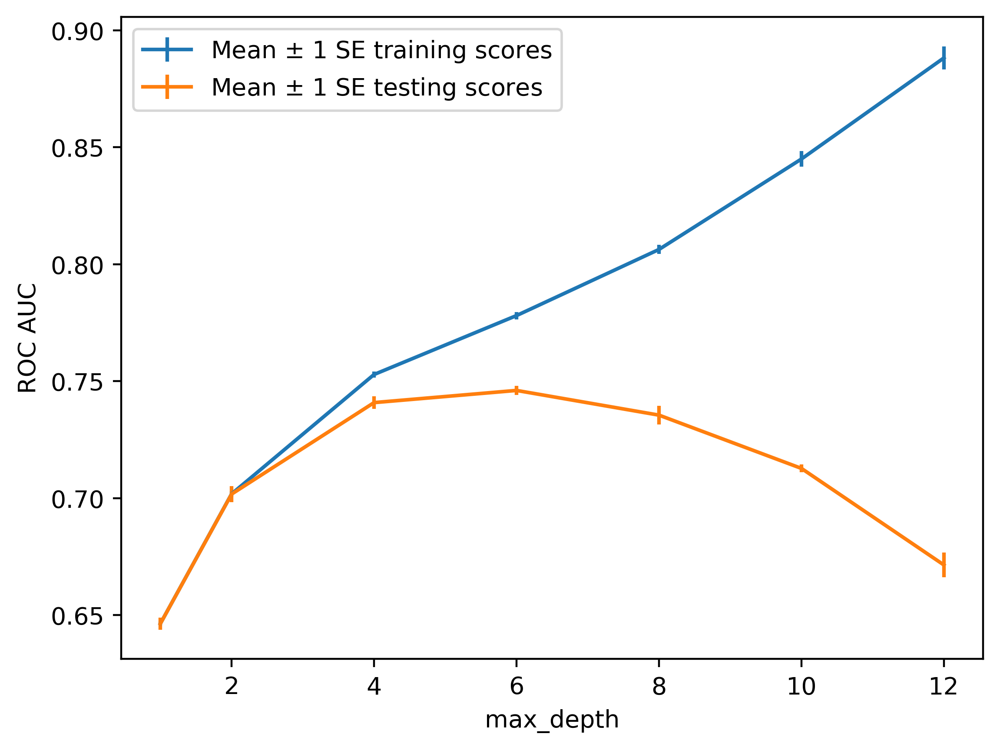

In [31]:
#Plot to compare max_depth and average testing score
ax = plt.axes()
ax.errorbar(cv_results_df['param_max_depth'],
cv_results_df['mean_train_score'],
yerr=cv_results_df['std_train_score']/np.sqrt(4),
label='Mean $\pm$ 1 SE training scores')
ax.errorbar(cv_results_df['param_max_depth'],
cv_results_df['mean_test_score'],
yerr=cv_results_df['std_test_score']/np.sqrt(4),
label='Mean $\pm$ 1 SE testing scores')
ax.legend()
plt.xlabel('max_depth')
plt.ylabel('ROC AUC')

## Random Forests: Ensembles of Decision Trees

How do random forests reduce the overfitting that affects decision trees? They differ from decision trees in terms of:

- The number of features considered at each split
- The training samples used to grow different trees

In [32]:
#Import random forest
from sklearn.ensemble import RandomForestClassifier

In [35]:
#Instantiate Class
rf = RandomForestClassifier(n_estimators=10,\
                            criterion='gini',\
                            max_depth=3,\
                            min_samples_split=2,\
                            min_samples_leaf=1,\
                            min_weight_fraction_leaf=0.0,\
                            max_features='auto',\
                            max_leaf_nodes=None,\
                            min_impurity_decrease=0.0,\
                            bootstrap=True,\
                            oob_score=False,\
                            n_jobs=None,
                            random_state=4,\
                            verbose=0,\
                            warm_start=False,\
                            class_weight=None)

In [36]:
#Create Parameter grid: Note, we will use max_depth = 3 for fun
rf_params_ex = {'n_estimators':list(range(10,110,10))}

In [37]:
#Cross Validation
cv_rf_ex = GridSearchCV(rf, param_grid=rf_params_ex,
scoring='roc_auc', n_jobs=None,
refit=True, cv=4, verbose=1,
pre_dispatch=None, error_score=np.nan,
return_train_score=True)

In [38]:
#Fit Cross Validation
cv_rf_ex.fit(X_train, y_train)

Fitting 4 folds for each of 10 candidates, totalling 40 fits


GridSearchCV(cv=4,
             estimator=RandomForestClassifier(max_depth=3, n_estimators=10,
                                              random_state=4),
             param_grid={'n_estimators': [10, 20, 30, 40, 50, 60, 70, 80, 90,
                                          100]},
             pre_dispatch=None, return_train_score=True, scoring='roc_auc',
             verbose=1)

In [39]:
#Put results into dataframe
cv_rf_ex_results_df = pd.DataFrame(cv_rf_ex.cv_results_)
cv_rf_ex_results_df

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,mean_train_score,std_train_score
0,0.133723,0.074363,0.005280,0.001063,10,{'n_estimators': 10},0.739183,0.746599,0.772127,0.771322,0.757308,0.014656,10,0.767973,0.767158,0.760550,0.763683,0.764841,0.002955
1,0.180657,0.002752,0.007882,0.002069,20,{'n_estimators': 20},0.745612,0.753712,0.777616,0.771737,0.762169,0.012998,9,0.772819,0.771499,0.765944,0.765395,0.768914,0.003284
2,0.268472,0.021689,0.009787,0.001169,30,{'n_estimators': 30},0.747259,0.754154,0.777954,0.771825,0.762798,0.012524,7,0.774655,0.772100,0.765026,0.766697,0.769620,0.003910
3,0.329091,0.008639,0.011421,0.000358,40,{'n_estimators': 40},0.746682,0.754553,0.777709,0.773134,0.763020,0.012813,4,0.774300,0.772642,0.765051,0.765876,0.769467,0.004057
4,0.405835,0.002396,0.013542,0.000385,50,{'n_estimators': 50},0.748009,0.755878,0.779465,0.771250,0.763651,0.012379,1,0.775241,0.774025,0.765732,0.766947,0.770486,0.004191
5,0.489848,0.001471,0.016016,0.000388,60,{'n_estimators': 60},0.748437,0.755604,0.779478,0.770978,0.763624,0.012252,2,0.775419,0.773615,0.766133,0.767032,0.770550,0.004031
6,0.581703,0.003230,0.018694,0.000241,70,{'n_estimators': 70},0.747491,0.754465,0.779104,0.771023,0.763021,0.012620,3,0.774420,0.773379,0.765960,0.766174,0.769983,0.003934
7,0.727815,0.036523,0.021768,0.000398,80,{'n_estimators': 80},0.747424,0.754488,0.778753,0.770872,0.762884,0.012502,5,0.774234,0.773257,0.765978,0.766220,0.769922,0.003840
8,0.805733,0.039681,0.025312,0.001662,90,{'n_estimators': 90},0.747097,0.753794,0.778507,0.770426,0.762456,0.012571,8,0.774095,0.772973,0.766022,0.765748,0.769709,0.003846
9,0.979489,0.113762,0.032820,0.005772,100,{'n_estimators': 100},0.747221,0.753924,0.779195,0.770937,0.762819,0.012811,6,0.774340,0.773598,0.766103,0.766914,0.770238,0.003750


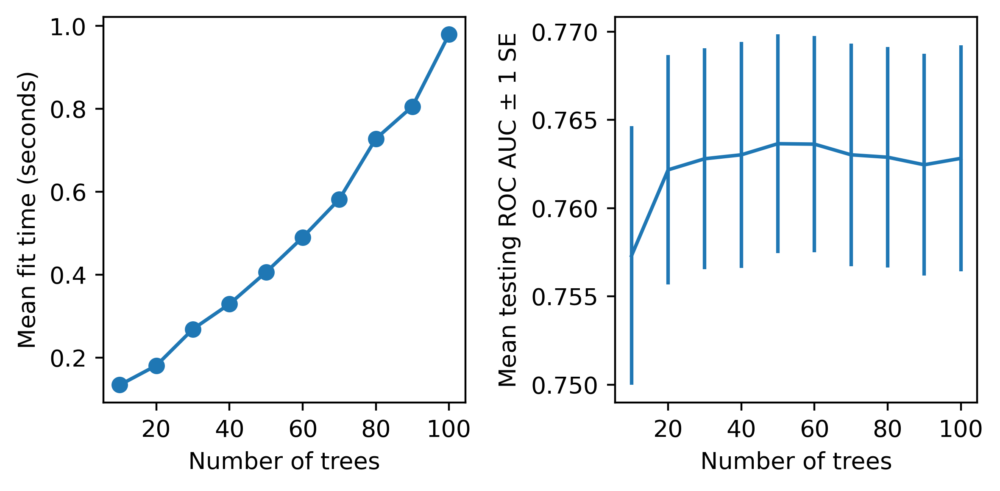

In [43]:
#Subplots of mean training time and mean testing scores with standard error
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(6, 3))
axs[0].plot(cv_rf_ex_results_df['param_n_estimators'],
            cv_rf_ex_results_df['mean_fit_time'],
            '-o')
axs[0].set_xlabel('Number of trees')
axs[0].set_ylabel('Mean fit time (seconds)')
axs[1].errorbar(cv_rf_ex_results_df['param_n_estimators'],
                cv_rf_ex_results_df['mean_test_score'],
                yerr=cv_rf_ex_results_df['std_test_score']/
np.sqrt(4))
axs[1].set_xlabel('Number of trees')
axs[1].set_ylabel('Mean testing ROC AUC $\pm$ 1 SE ')
plt.tight_layout()

In [44]:
#Show the best hyperparameters from cross-validation
cv_rf_ex.best_params_

{'n_estimators': 50}

<AxesSubplot:>

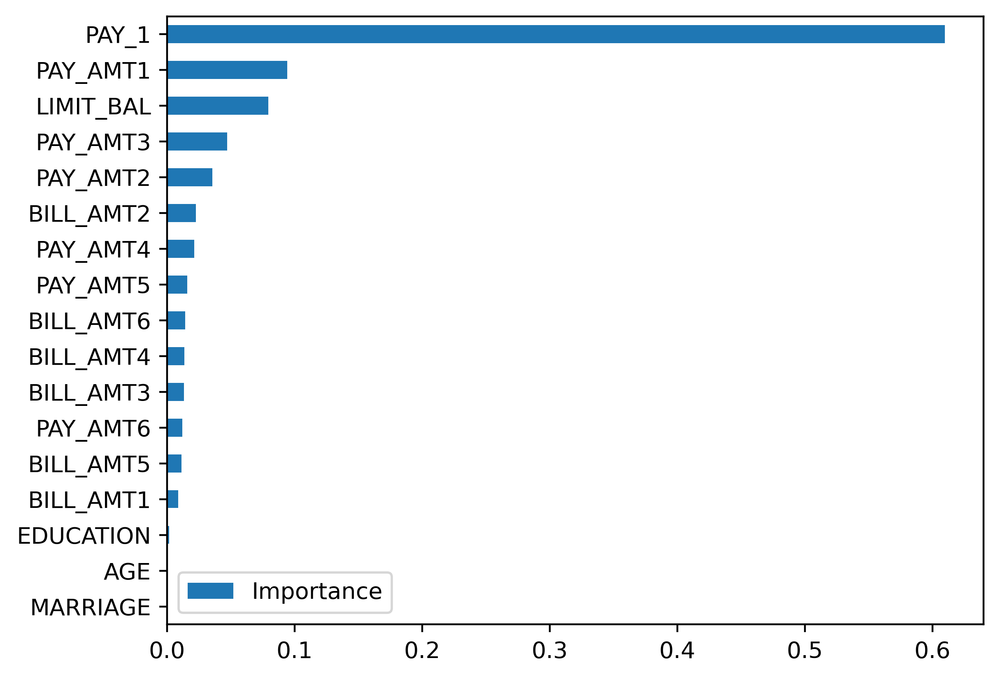

In [45]:
#Data frame of feature names and importance + horizontal bar plot sorted by importance
feat_imp_df = pd.DataFrame({
    'Importance':cv_rf_ex.best_estimator_.feature_importances_},
    index=features_response[:-1])
feat_imp_df.sort_values('Importance', ascending=True).plot.barh()